tensor([-0.0005, -0.0059, -0.0485, -0.1166, -0.0504, -0.0482, -0.0525, -0.0078,
        -0.1147, -0.0501, -0.0413, -0.0466, -0.0502, -0.0542, -0.0341, -0.1149,
        -0.0539, -0.1122, -0.0034, -0.0164, -0.0202, -0.0506, -0.0285, -0.0657,
        -0.0207, -0.0187, -0.0515, -0.0224, -0.0368, -0.0462, -0.0070, -0.0548,
        -0.1149, -0.1140, -0.0409, -0.0070, -0.0147, -0.0205, -0.0481, -0.0109,
        -0.0527, -0.0979, -0.1131, -0.0380, -0.0305, -0.0513, -0.0444, -0.0196,
        -0.0669, -0.0309, -0.1166, -0.0462, -0.0201, -0.0321, -0.0379, -0.0283,
        -0.0511, -0.0538, -0.0274, -0.0818, -0.0210, -0.0431, -0.0276, -0.0272,
        -0.1091, -0.0479, -0.0429, -0.0295, -0.1064, -0.0083, -0.0166, -0.0348,
        -0.0487, -0.0173, -0.0244, -0.0305, -0.0293, -0.0345, -0.0577, -0.0206,
        -0.0315, -0.0353, -0.0309, -0.0503, -0.1156, -0.0454, -0.1139, -0.0552,
        -0.0068, -0.0422, -0.1147, -0.0419, -0.0009, -0.0520, -0.0432, -0.0108,
        -0.0477, -0.0791, -0.0724, -0.04

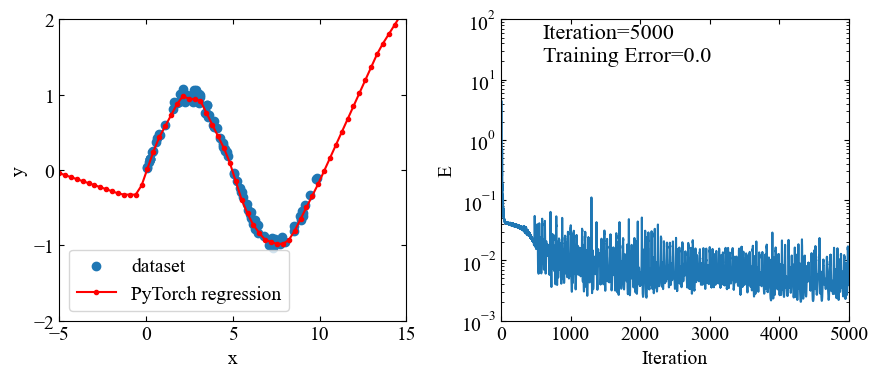

In [9]:
import torch
from torch import nn, optim
import numpy as np
from matplotlib import pyplot as plt

# 線形回帰ネットワークのclassをnn.Moduleの継承で定義
class Regression(nn.Module):
    # コンストラクタ(インスタンス生成時の初期化)
    def __init__(self):
        super().__init__()
        self.linear1 = nn.Linear(2, 32)
        self.linear2 = nn.Linear(32, 16)
        self.linear3 = nn.Linear(16, 1)

    # メソッド(ネットワークをシーケンシャルに定義)
    def forward(self, x):
        x = nn.functional.relu(self.linear1(x))
        x = nn.functional.relu(self.linear2(x))
        x = self.linear3(x)
        return x

# トレーニング関数
def train(model, optimizer, E, iteration, x, y):
    # 学習ループ
    losses = []
    for i in range(iteration):
        optimizer.zero_grad()                   # 勾配情報を0に初期化
        y_pred = model(x)                       # 予測
        print(y_pred.reshape(y.shape))
        print(y)
        loss = E(y_pred.reshape(y.shape), y)    # 損失を計算(shapeを揃える)
        loss.backward()                         # 勾配の計算
        optimizer.step()                        # 勾配の更新
        losses.append(loss.item())              # 損失値の蓄積
        #print('epoch=', i+1, 'loss=', loss)
    return model, losses

def test(model, x):
    y_pred = model(x).data.numpy().T[0]  # 予測
    return y_pred

# グラフ描画関数
def plot(x, y, x_new, y_pred, losses):
    # ここからグラフ描画-------------------------------------------------
    # フォントの種類とサイズを設定する。
    plt.rcParams['font.size'] = 14
    plt.rcParams['font.family'] = 'Times New Roman'

    # 目盛を内側にする。
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'

    # グラフの上下左右に目盛線を付ける。
    fig = plt.figure(figsize=(9, 4))
    ax1 = fig.add_subplot(121)
    ax1.yaxis.set_ticks_position('both')
    ax1.xaxis.set_ticks_position('both')
    ax2 = fig.add_subplot(122)
    ax2.yaxis.set_ticks_position('both')
    ax2.xaxis.set_ticks_position('both')

    # 軸のラベルを設定する。
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax2.set_xlabel('Iteration')
    ax2.set_ylabel('E')

    # スケール設定
    ax1.set_xlim(-5, 15)
    ax1.set_ylim(-2, 2)
    ax2.set_xlim(0, 5000)
    ax2.set_ylim(0.001, 100)
    ax2.set_yscale('log')

    # データプロット
    ax1.scatter(x, y, label='dataset')
    ax1.plot(x_new, y_pred, color='red', label='PyTorch regression', marker="o", markersize=3)
    ax2.plot(np.arange(0, len(losses), 1), losses)
    ax2.text(600, 20, 'Training Error=' + str(round(losses[len(losses)-1], 2)), fontsize=16)
    ax2.text(600, 50, 'Iteration=' + str(round(len(losses), 1)), fontsize=16)

    # グラフを表示する。
    ax1.legend()
    fig.tight_layout()
    plt.show()
    plt.close()
    # -------------------------------------------------------------------

# トレーニングデータ
x = np.random.uniform(0, 10, 100)                                   # x軸をランダムで作成
y = np.random.uniform(0.9, 1.1, 100) * np.sin(2 * np.pi * 0.1 * x)  # 正弦波を作成
x = torch.from_numpy(x.astype(np.float32)).float()                  # xをテンソルに変換
y = torch.from_numpy(y.astype(np.float32)).float()                  # yをテンソルに変換
X = torch.stack([torch.ones(100), x], 1)                            # xに切片用の定数1配列を結合

# テストデータ
x_test = np.linspace(-5, 15, 60)                                    # x軸を作成
x_test = torch.from_numpy(x_test.astype(np.float32)).float()        # xをテンソルに変換
X_test = torch.stack([torch.ones(60), x_test], 1)                   # xに切片用の定数1配列を結合

# ネットワークのインスタンスを生成
net = Regression()

# 最適化アルゴリズムと損失関数を設定
optimizer = optim.RMSprop(net.parameters(), lr=0.01)                # 最適化にRMSpropを設定
E = nn.MSELoss()                                                    # 損失関数にMSEを設定

# トレーニング
net, losses = train(model=net, optimizer=optimizer, E=E, iteration=5000, x=X, y=y)

# テスト
y_pred = test(net, X_test)

# グラフ描画
plot(x, y, X_test.data.numpy().T[1], y_pred, losses)


